In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

In [4]:
training_set = tf.keras.utils.image_dataset_from_directory(
    "C:\\Users\\dhanu\\Downloads\\test",
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(64, 64),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False
)

Found 359 files belonging to 36 classes.


In [5]:
validation_set = tf.keras.utils.image_dataset_from_directory(
    "C:\\Users\\dhanu\\Downloads\\validation",
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(64, 64),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False
)
     

Found 351 files belonging to 36 classes.


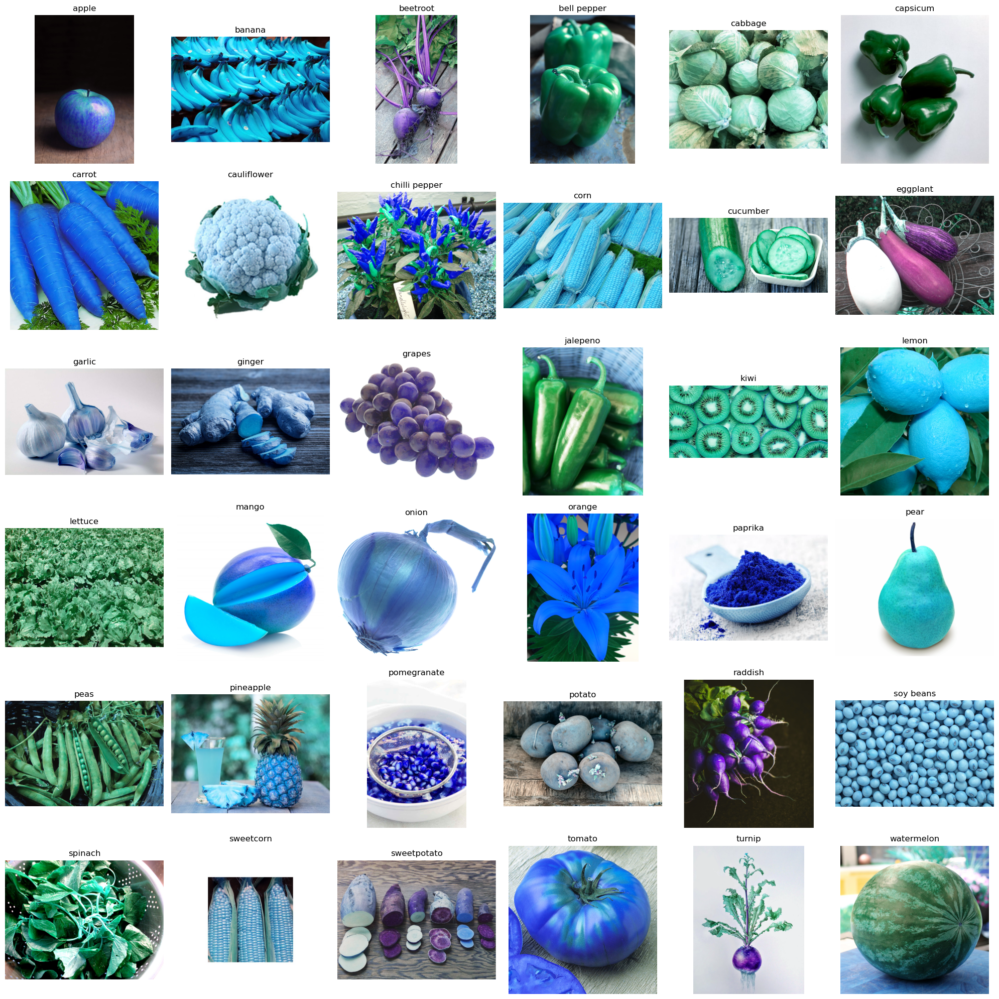

In [6]:
import os
import random
import matplotlib.pyplot as plt
import cv2

# Define the path to the dataset directory
dataset_path = "C:\\Users\\dhanu\\Downloads\\train"

# Get the list of class names from the directory
class_names = os.listdir(dataset_path)

# Calculate the number of rows and columns for subplots
num_rows = 6
num_cols = (len(class_names) + num_rows - 1) // num_rows

# Create a figure and subplots to display the images
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))

# Iterate over each class and randomly select one image to display
for i, class_name in enumerate(class_names):
    row = i // num_cols
    col = i % num_cols
    class_dir = os.path.join(dataset_path, class_name)
    image_files = os.listdir(class_dir)
    random_image = random.choice(image_files)
    image_path = os.path.join(class_dir, random_image)
    image = cv2.imread(image_path)
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    axes[row, col].imshow(image)
    axes[row, col].set_title(class_name)
    axes[row, col].axis('off')

# Remove empty subplots if there are any
for i in range(len(class_names), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

# Adjust spacing between subplots
plt.tight_layout()

plt.show()

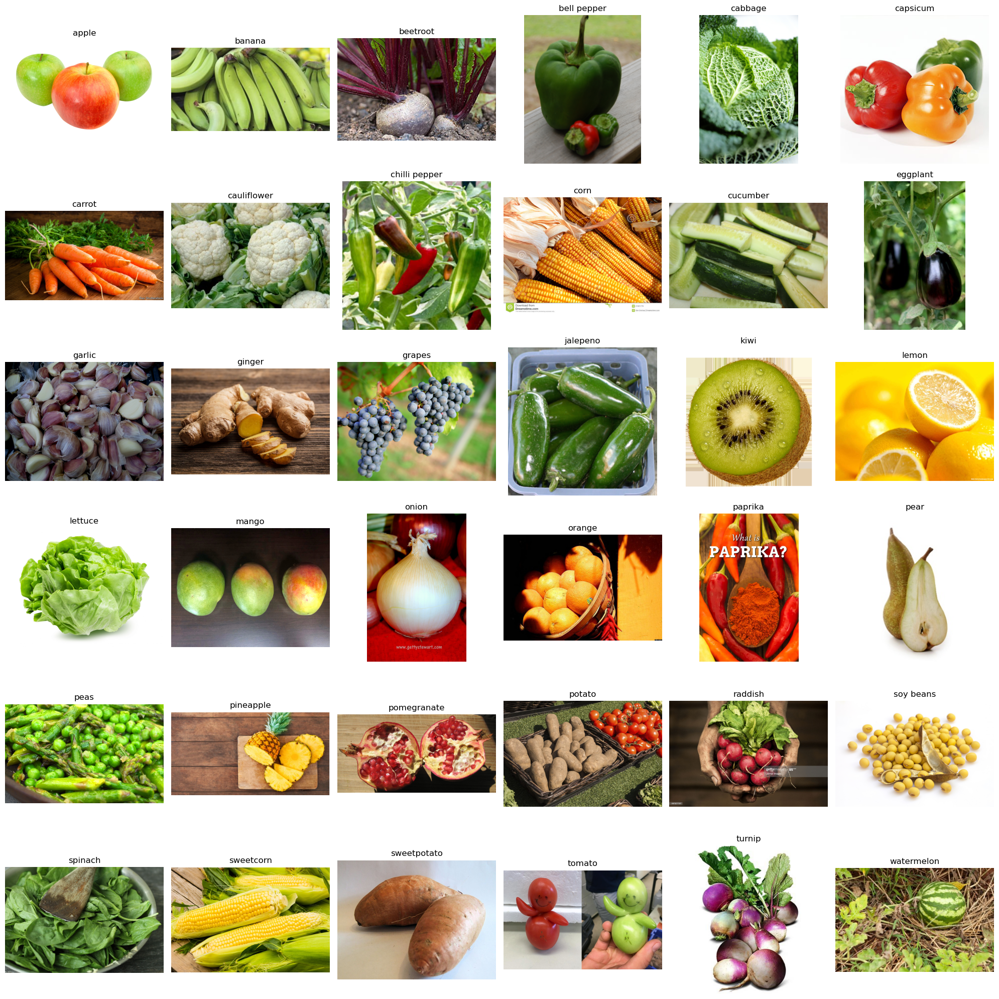

In [7]:
# Get the list of class names from the directory
class_names = os.listdir(dataset_path)

# Calculate the number of rows and columns for subplots
num_rows = 6
num_cols = (len(class_names) + num_rows - 1) // num_rows

# Create a figure and subplots to display the images
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))

# Iterate over each class and randomly select one image to display
for i, class_name in enumerate(class_names):
    row = i // num_cols
    col = i % num_cols
    class_dir = os.path.join(dataset_path, class_name)
    image_files = os.listdir(class_dir)
    random_image = random.choice(image_files)
    image_path = os.path.join(class_dir, random_image)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    axes[row, col].imshow(image)
    axes[row, col].set_title(class_name)
    axes[row, col].axis('off')

# Remove empty subplots if there are any
for i in range(len(class_names), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

# Adjust spacing between subplots
plt.tight_layout()

plt.show()

In [8]:
cnn = tf.keras.models.Sequential()


In [9]:
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',input_shape=[64,64,3]))
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))
cnn.add(tf.keras.layers.Dropout(0.25))
cnn.add(tf.keras.layers.Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'))
cnn.add(tf.keras.layers.Conv2D(filters=64,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))
cnn.add(tf.keras.layers.Dropout(0.25))
cnn.add(tf.keras.layers.Flatten())
cnn.add(tf.keras.layers.Dense(units=512,activation='relu'))
cnn.add(tf.keras.layers.Dense(units=256,activation='relu'))
cnn.add(tf.keras.layers.Dropout(0.5)) #To avoid overfitting
#Output Layer
cnn.add(tf.keras.layers.Dense(units=36,activation='softmax'))

In [10]:
cnn.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 62, 62, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 31, 31, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 31, 31, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 29, 29, 64)        36928     
                                                        

In [11]:
training_history = cnn.fit(x=training_set,validation_data=validation_set,epochs=32)

Epoch 1/32
12/12 [==============================] - 8s 461ms/step - loss: 41.3286 - accuracy: 0.0279 - val_loss: 3.5767 - val_accuracy: 0.0228
Epoch 2/32
12/12 [==============================] - 7s 450ms/step - loss: 3.5930 - accuracy: 0.0251 - val_loss: 3.5820 - val_accuracy: 0.0399
Epoch 3/32
12/12 [==============================] - 7s 443ms/step - loss: 3.5767 - accuracy: 0.0306 - val_loss: 3.5755 - val_accuracy: 0.0513
Epoch 4/32
12/12 [==============================] - 7s 452ms/step - loss: 3.5743 - accuracy: 0.0418 - val_loss: 3.5565 - val_accuracy: 0.1111
Epoch 5/32
12/12 [==============================] - 7s 450ms/step - loss: 3.5608 - accuracy: 0.0390 - val_loss: 3.5461 - val_accuracy: 0.1282
Epoch 6/32
12/12 [==============================] - 7s 458ms/step - loss: 3.5316 - accuracy: 0.0585 - val_loss: 3.4690 - val_accuracy: 0.1595
Epoch 7/32
12/12 [==============================] - 7s 457ms/step - loss: 3.4645 - accuracy: 0.0696 - val_loss: 3.3651 - val_accuracy: 0.1538
Epoch

In [12]:
#Training set Accuracy
train_loss, train_acc = cnn.evaluate(training_set)
print('Training accuracy:', train_acc)   

12/12 [==============================] - 3s 70ms/step - loss: 0.0602 - accuracy: 0.9889
Training accuracy: 0.9888579249382019


In [13]:
#Validation set Accuracy
val_loss, val_acc = cnn.evaluate(validation_set)
print('Validation accuracy:', val_acc)

11/11 [==============================] - 2s 77ms/step - loss: 0.0611 - accuracy: 0.9886
Validation accuracy: 0.9886040091514587


In [14]:
cnn.save('trained_model.h5')

In [15]:
training_history.history #Return Dictionary of history


{'loss': [41.32859802246094,
  3.593015193939209,
  3.576704740524292,
  3.5743446350097656,
  3.5608267784118652,
  3.531618595123291,
  3.4645166397094727,
  3.3991427421569824,
  3.3060829639434814,
  3.098083734512329,
  2.6664042472839355,
  2.2673778533935547,
  2.023244619369507,
  1.765715479850769,
  1.3697965145111084,
  1.186140537261963,
  1.1324390172958374,
  0.9302695393562317,
  0.8708288073539734,
  0.6799957156181335,
  0.6551693677902222,
  0.5165700912475586,
  0.5286802649497986,
  0.40969741344451904,
  0.5390347838401794,
  0.30480629205703735,
  0.346663236618042,
  0.3505878746509552,
  0.26637449860572815,
  0.3406226336956024,
  0.26574939489364624,
  0.2479277104139328],
 'accuracy': [0.027855154126882553,
  0.02506963722407818,
  0.03064066916704178,
  0.04178272932767868,
  0.038997214287519455,
  0.05849582329392433,
  0.06963787972927094,
  0.09470751881599426,
  0.11420612782239914,
  0.16991643607616425,
  0.2869080901145935,
  0.42061281204223633,
  0

In [16]:
print("Validation set Accuracy: {} %".format(training_history.history['val_accuracy'][-1]*100))


Validation set Accuracy: 98.86040091514587 %


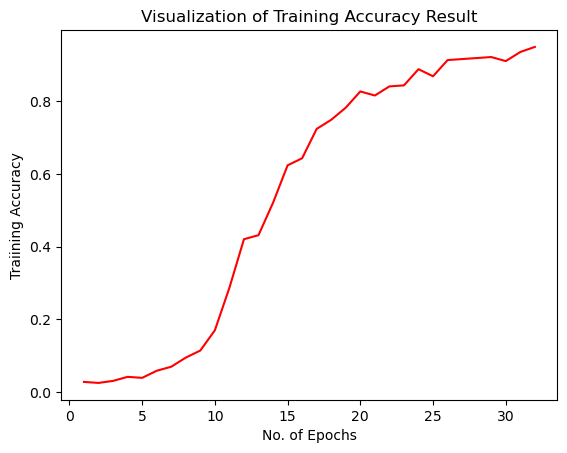

In [17]:
epochs = [i for i in range(1,33)]
plt.plot(epochs,training_history.history['accuracy'],color='red')
plt.xlabel('No. of Epochs')
plt.ylabel('Traiining Accuracy')
plt.title('Visualization of Training Accuracy Result')
plt.show()

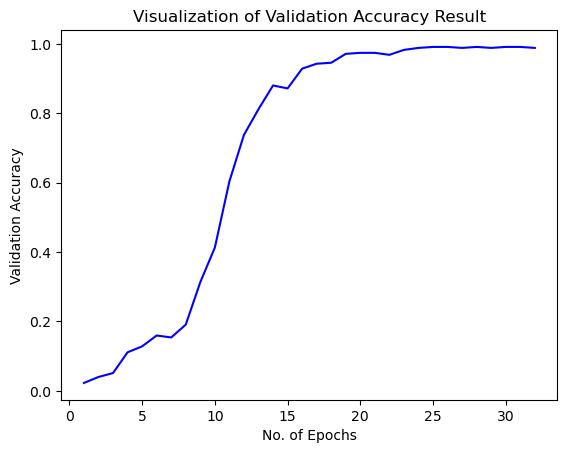

In [18]:

plt.plot(epochs,training_history.history['val_accuracy'],color='blue')
plt.xlabel('No. of Epochs')
plt.ylabel('Validation Accuracy')
plt.title('Visualization of Validation Accuracy Result')
plt.show()

In [21]:
test_x = tf.keras.utils.image_dataset_from_directory(
    "C:\\Users\\dhanu\\Downloads\\test",
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(64, 64),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False
)

Found 359 files belonging to 36 classes.


In [22]:

test_loss,test_acc = cnn.evaluate(test_x)
print('Test accuracy:', test_acc)

12/12 [==============================] - 3s 53ms/step - loss: 0.0602 - accuracy: 0.9889
Test accuracy: 0.9888579249382019


In [24]:
test_set = tf.keras.utils.image_dataset_from_directory(
    "C:\\Users\\dhanu\\Downloads\\test",
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(64, 64),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False
)

Found 359 files belonging to 36 classes.


In [27]:
cnn = tf.keras.models.load_model('trained_model.h5')


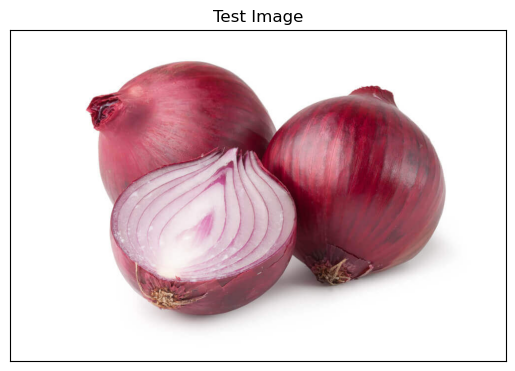

In [28]:
#Test Image Visualization
import cv2
image_path = 'C:\\Users\\dhanu\\Downloads\\test\\onion\\Image_5.jpg'
# Reading an image in default mode
img = cv2.imread(image_path)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) #Converting BGR to RGB
# Displaying the image 
plt.imshow(img)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.show()

In [29]:
image = tf.keras.preprocessing.image.load_img(image_path,target_size=(64,64))
input_arr = tf.keras.preprocessing.image.img_to_array(image)
input_arr = np.array([input_arr])  # Convert single image to a batch.
predictions = cnn.predict(input_arr)

1/1 [==============================] - 0s 87ms/step


In [30]:
result_index = np.argmax(predictions) #Return index of max element
print(result_index)

20


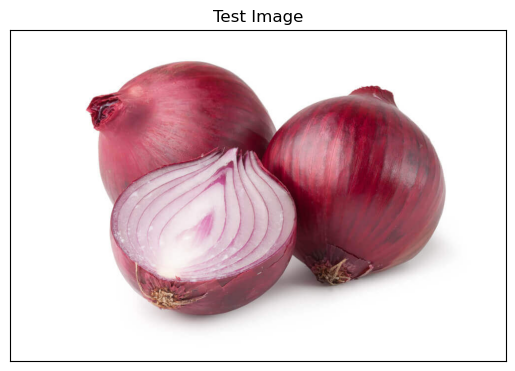

In [31]:
# Displaying the image 
plt.imshow(img)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.show()

In [32]:
#Single image Prediction
print("It's a {}".format(test_set.class_names[result_index]))

It's a onion
